# Exploring the Lovecraft Corpus - Principal Component Analysis  
Ryan Folks  
DS5001  
vcz2aj@virginia.edu  

### Objective: The objective of this notebook is to apply principal component analysis to the lovecraft corpus.
---

In [83]:
import pandas as pd
import numpy as np
from scipy.linalg import norm
from scipy.linalg import eigh
import plotly.express as px
import seaborn as sns; sns.set()

In [2]:
norm_docs = True # L2 norming
center_by_mean = False 
center_by_variance = False # Not supposed to ... Exaggerates significance of rare words
n_terms = 1000 # Number of significant words; feature space
k = 6 # Number of components

OHCO = ['title']

## Import Data Files

In [51]:
BOW = pd.read_csv('data/output/lovecraft_BOW.csv').set_index(OHCO+['sent_num', 'term_str'])
VOCAB = pd.read_csv('data/output/lovecraft_VOCAB.csv').set_index('term_str')
LIB = pd.read_csv('data/output/lovecraft_LIB.csv').set_index('title')

In [52]:
LIB['title_dupe'] = LIB.index
#LIB.set_index('title_type')
LIB

,filepath,date,category,title_dupe
title,,,,
the alchemist,data/short_stories\alchemist.txt,1908,short story,the alchemist
facts concerning the late arthur jermyn and his family,data/short_stories\arthur_jermyn.txt,1920,short story,facts concerning the late arthur jermyn and hi...
azathoth,data/short_stories\azathoth.txt,1922,short story,azathoth
the beast in the cave,data/short_stories\beast.txt,1905,short story,the beast in the cave
beyond the wall of sleep,data/short_stories\beyond_wall_of_sleep.txt,1919,short story,beyond the wall of sleep
...,...,...,...,...
the wood,data/poetry\The Wood.txt,1929,poem,the wood
"to clark ashton smith, esq., upon his phantastick tales, verses, pictures, and sculptures","data/poetry\To Clark Ashton Smith, Esq., upon ...",1936,poem,"to clark ashton smith, esq., upon his phantast..."
"to edward john moreton drax plunkett, eighteenth baron dunsany",data/poetry\To Edward John Moreton Drax Plunke...,1919,poem,"to edward john moreton drax plunkett, eighteen..."


In [29]:
SIGS = VOCAB.sort_values('dfidf', ascending=False).head(n_terms).index

In [30]:
TFIDF = BOW.tfidf.unstack(fill_value=0)[SIGS]

In [31]:
TFIDF

term_str                       cold  secret         d  read  fancy  her  \
title                sent_num                                             
a garden             0          0.0     0.0  0.000000   0.0    0.0  0.0   
                     1          0.0     0.0  0.000000   0.0    0.0  0.0   
                     2          0.0     0.0  0.077924   0.0    0.0  0.0   
                     3          0.0     0.0  0.000000   0.0    0.0  0.0   
                     4          0.0     0.0  0.056672   0.0    0.0  0.0   
...                             ...     ...       ...   ...    ...  ...   
what the moon brings 13         0.0     0.0  0.000000   0.0    0.0  0.0   
                     14         0.0     0.0  0.000000   0.0    0.0  0.0   
                     15         0.0     0.0  0.000000   0.0    0.0  0.0   
                     16         0.0     0.0  0.000000   0.0    0.0  0.0   
                     17         0.0     0.0  0.000000   0.0    0.0  0.0   

term_str                       tales  least  free  silence  ...  ominous  \
title                sent_num                               ...            
a garden             0           0.0    0.0   0.0      0.0  ...      0.0   
                     1           0.0    0.0   0.0      0.0  ...      0.0   
                     2           0.0    0.0   0.0      0.0  ...      0.0   
                     3           0.0    0.0   0.0      0.0  ...      0.0   
                     4           0.0    0.0   0.0      0.0  ...      0.0   
...                              ...    ...   ...      ...  ...      ...   
what the moon brings 13          0.0    0.0   0.0      0.0  ...      0.0   
                     14          0.0    0.0   0.0      0.0  ...      0.0   
                     15          0.0    0.0   0.0      0.0  ...      0.0   
                     16          0.0    0.0   0.0      0.0  ...      0.0   
                     17          0.0    0.0   0.0      0.0  ...      0.0   

term_str                       comes  doorway  stumbled  damnable  dimly  boy  \
title                sent_num                                                   
a garden             0           0.0      0.0       0.0       0.0    0.0  0.0   
                     1           0.0      0.0       0.0       0.0    0.0  0.0   
                     2           0.0      0.0       0.0       0.0    0.0  0.0   
                     3           0.0      0.0       0.0       0.0    0.0  0.0   
                     4           0.0      0.0       0.0       0.0    0.0  0.0   
...                              ...      ...       ...       ...    ...  ...   
what the moon brings 13          0.0      0.0       0.0       0.0    0.0  0.0   
                     14          0.0      0.0       0.0       0.0    0.0  0.0   
                     15          0.0      0.0       0.0       0.0    0.0  0.0   
                     16          0.0      0.0       0.0       0.0    0.0  0.0   
                     17          0.0      0.0       0.0       0.0    0.0  0.0   

term_str                       lives  moments  result  
title                sent_num                          
a garden             0           0.0      0.0     0.0  
                     1           0.0      0.0     0.0  
                     2           0.0      0.0     0.0  
                     3           0.0      0.0     0.0  
                     4           0.0      0.0     0.0  
...                              ...      ...     ...  
what the moon brings 13          0.0      0.0     0.0  
                     14          0.0      0.0     0.0  
                     15          0.0      0.0     0.0  
                     16          0.0      0.0     0.0  
                     17          0.0      0.0     0.0  

[19578 rows x 1000 columns]

## Doc table

In [53]:
lib_cols = "category title_dupe".split()
DOC = pd.DataFrame(index=TFIDF.index)
DOC = DOC.join(LIB[lib_cols], on='title')

DOC['label'] = DOC.apply(lambda x: "{}-{}".format(x.title_dupe, x.category, x.name[1]), 1)
DOC['mean_tfidf'] = TFIDF.mean(1)
DOC['n_tokens'] = BOW.groupby(['title']).n.sum()

DOC

category            title_dupe  \
title                sent_num                                      
a garden             0                poem              a garden   
                     1                poem              a garden   
                     2                poem              a garden   
                     3                poem              a garden   
                     4                poem              a garden   
...                                    ...                   ...   
what the moon brings 13        short story  what the moon brings   
                     14        short story  what the moon brings   
                     15        short story  what the moon brings   
                     16        short story  what the moon brings   
                     17        short story  what the moon brings   

                                                          label  mean_tfidf  \
title                sent_num                                                 
a garden             0                            a garden-poem    0.000445   
                     1                            a garden-poem    0.000217   
                     2                            a garden-poem    0.000906   
                     3                            a garden-poem    0.000647   
                     4                            a garden-poem    0.000642   
...                                                         ...         ...   
what the moon brings 13        what the moon brings-short story    0.000695   
                     14        what the moon brings-short story    0.000239   
                     15        what the moon brings-short story    0.000334   
                     16        what the moon brings-short story    0.000493   
                     17        what the moon brings-short story    0.000343   

                               n_tokens  
title                sent_num            
a garden             0              NaN  
                     1              NaN  
                     2              NaN  
                     3              NaN  
                     4              NaN  
...                                 ...  
what the moon brings 13             NaN  
                     14             NaN  
                     15             NaN  
                     16             NaN  
                     17             NaN  

[19578 rows x 5 columns]

In [54]:
if norm_docs:
    print("L2 norming")
    TFIDF = TFIDF.apply(lambda x: x / norm(x), 1).fillna(0) # Euclidean norming

L2 norming


In [55]:
if center_by_mean:
    print("Centering by mean")
    TFIDF = TFIDF - TFIDF.mean()

if center_by_variance:
    print("Centering by variance")
    TFIDF = TFIDF / TFIDF.std()

## Covariance Matrix

In [60]:
COV = TFIDF.cov()
COV.stack().sort_values().loc['cold']

term_str
'          -0.000032
we         -0.000032
you        -0.000027
n't        -0.000023
``         -0.000021
              ...   
spring      0.000054
twilight    0.000055
gods        0.000062
unknown     0.000086
cold        0.001082
Length: 1000, dtype: float64

## PCA decomposition

In [62]:
w, v = eigh(COV, subset_by_index=(len(COV)-k,len(COV)-1))

pc_ids = list(reversed([i for i in range(k)]))

C = pd.DataFrame(w, columns=['eig_val'])
C.index = pc_ids
C = C.sort_index()
C.index.name = 'pc_id'
C['exp_var'] = C.eig_val / C.eig_val.sum()

In [63]:
C

,eig_val,exp_var
pc_id,,
0,0.009020,0.214893
1,0.007704,0.183538
2,0.006965,0.165920
3,0.006477,0.154314
4,0.006088,0.145037
5,0.005721,0.136297


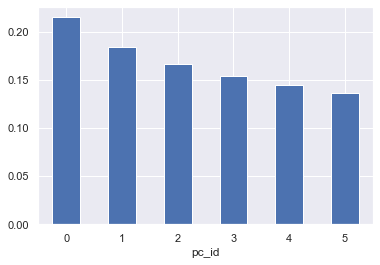

In [64]:
C.exp_var.plot.bar(rot=0);

Not great but there is some variance explained by the components.

In [65]:
L = pd.DataFrame(v, index=COV.index)
L.columns = pc_ids
L = L.T.sort_index().T
L.columns.name = 'pc_id'

In [66]:
L.sample(20).style.background_gradient(cmap='GnBu', high=.5)

pc_id,0,1,2,3,4,5
term_str,,,,,,
merely,-0.001888,-0.004389,0.004288,-0.001351,0.003007,-0.002695
ceased,-0.002860,0.001405,0.001866,0.002971,0.003703,0.001805
cry,-0.000829,-0.001857,-0.003573,-0.001293,0.003771,-0.007191
took,0.000999,0.008261,0.007463,0.000993,0.000423,-0.000566
sane,-0.002384,-0.000117,-0.000354,0.003653,0.001618,0.002493
stop,0.002586,-0.000768,0.001401,-0.002763,0.001572,-0.002867
small,-0.012909,0.007161,0.010399,0.001327,0.005988,-0.000556
am,0.023578,-0.025600,0.004267,-0.027714,0.010146,0.010569
bringing,-0.001156,0.000691,-0.000275,-0.000514,0.001368,0.000524


In [67]:
DCM = TFIDF.dot(L)

In [68]:
DCM.sample(20).style.background_gradient(cmap='GnBu', high=.5)

,pc_id,0,1,2,3,4,5
title,sent_num,,,,,,
pickman's model,173,-0.015198,0.004601,0.017236,-0.008884,-0.032979,0.014930
the shadow out of time,865,-0.011782,0.006397,0.006977,0.001709,-0.001543,0.000843
medusa's coil,36,0.184409,-0.314985,0.060018,-0.396294,-0.016962,0.207433
cool air,103,-0.000452,0.008317,0.009366,0.004925,0.006140,-0.006178
at the mountains of madness,64,-0.036610,0.043435,0.024017,-0.018749,-0.333328,-0.000223
the dream-quest of unknown kadath,574,-0.011204,0.012093,0.001107,0.001823,0.010110,-0.000117
the shadow over innsmouth,1056,-0.013414,0.006839,0.013988,0.004288,0.011318,-0.003697
the call of cthulhu,365,-0.013446,0.018626,0.021627,-0.000607,0.014213,-0.006165
the rats in the walls,207,-0.008967,0.006688,0.000635,0.004477,0.005686,0.000682


In [69]:
# Extract poles

top_n = 6 # Number of top words for each pole
for i in range(k):
    for j, pole in enumerate(['neg','pos']):
        top_terms = ' '.join(L.sort_values(i, ascending=bool(j)).head(top_n).index.to_list())
        C.loc[i, pole] = top_terms

In [70]:
C

,eig_val,exp_var,neg,pos
pc_id,,,,
0,0.009020,0.214893,' you ? n't `` o,we ’ our d even two
1,0.007704,0.183538,' we o our ’ d,? you `` '' do n't
2,0.006965,0.165920,you we even n't `` much,’ d ? s er o
3,0.006477,0.154314,? ' why how indeed himself,you ’ n't d will do
4,0.006088,0.145037,her she nothing room gods something,we our ? us n't do
5,0.005721,0.136297,you ? do how ' tell,`` '' : ’ said god


In [71]:
try:
    DOC = DOC.join(DCM)
except:
    pass

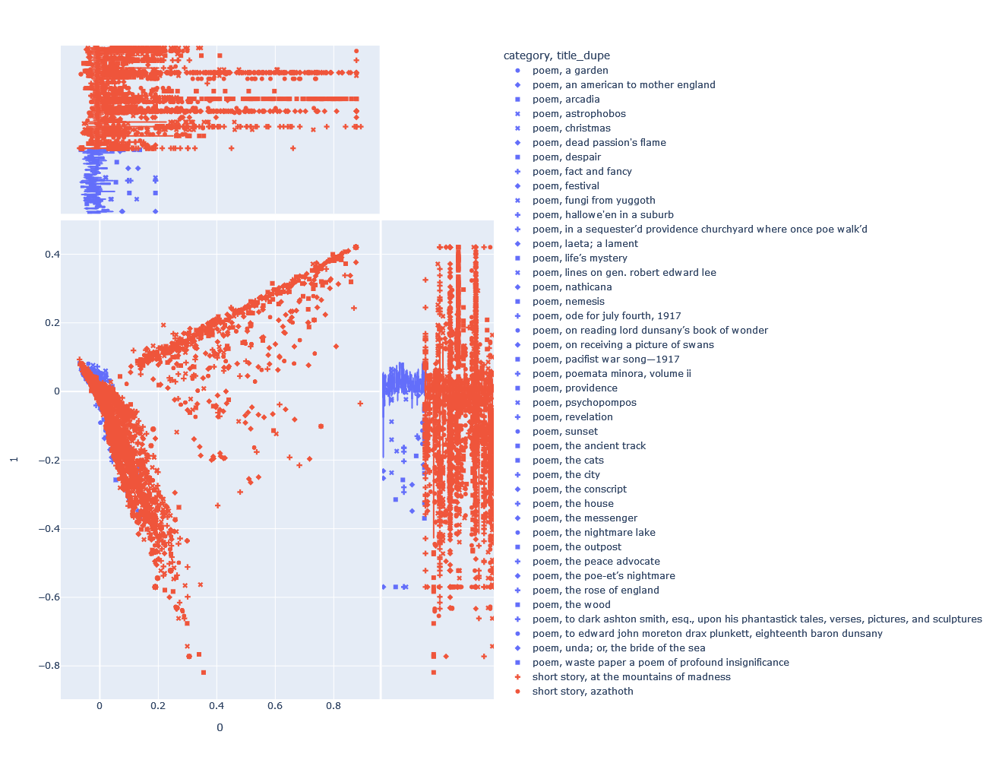

In [74]:
px.scatter(DOC, 0, 1, 
           symbol='title_dupe', 
           color='category',
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

In [90]:
LIB

,filepath,date,category,title_dupe,title_dupe_cat
title,,,,,
the alchemist,data/short_stories\alchemist.txt,1908,short story,the alchemist,the alchemist(short story)
facts concerning the late arthur jermyn and his family,data/short_stories\arthur_jermyn.txt,1920,short story,facts concerning the late arthur jermyn and hi...,facts concerning the late arthur jermyn and hi...
azathoth,data/short_stories\azathoth.txt,1922,short story,azathoth,azathoth(short story)
the beast in the cave,data/short_stories\beast.txt,1905,short story,the beast in the cave,the beast in the cave(short story)
beyond the wall of sleep,data/short_stories\beyond_wall_of_sleep.txt,1919,short story,beyond the wall of sleep,beyond the wall of sleep(short story)
...,...,...,...,...,...
the wood,data/poetry\The Wood.txt,1929,poem,the wood,the wood(poem)
"to clark ashton smith, esq., upon his phantastick tales, verses, pictures, and sculptures","data/poetry\To Clark Ashton Smith, Esq., upon ...",1936,poem,"to clark ashton smith, esq., upon his phantast...","to clark ashton smith, esq., upon his phantast..."
"to edward john moreton drax plunkett, eighteenth baron dunsany",data/poetry\To Edward John Moreton Drax Plunke...,1919,poem,"to edward john moreton drax plunkett, eighteen...","to edward john moreton drax plunkett, eighteen..."


In [91]:
LIB['title_dupe_cat'] = LIB.title_dupe + '(' + LIB.category + ')'
LIB['title_dupe_cat_date'] = LIB.title_dupe + '(' + LIB.category + ')' + '(' + LIB.date + ')'

In [75]:
print(C.loc[1, ['pos','neg']].values)

["? you `` '' do n't" "' we o our ’ d"]


This is telling me nothing...

In [84]:
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import pdist
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from pandas import DataFrame as df

class HAC:
    """
    Takes an arbitrary vector space and represents it 
    as a hierarhical agglomerative cluster tree. 
    The number of observations should be sufficiently 
    small to allow being plotted.
    Attributes:
        w (int): The width of the figure in inches.
        label_size (int): The font size of the labels in points.
        orientation (str): The orientation of the figure; 'top', 'bottom', 'left', 'right'. Defaults to 'left'.
        dist_measure (str): The distance measure to use; braycurtis, canberra, chebyshev, cityblock, correlation, 
            cosine, dice, euclidean, hamming, jaccard, jensenshannon, kulsinski, kulczynski1, mahalanobis, matching, 
            minkowski, rogerstanimoto, russellrao, seuclidean, sokalmichener, sokalsneath, sqeuclidean, yule. 
            Defaults to euclidean.
        linkage_method (str): The linkage method to use; single, complete, average, weighted, centroid, median, ward
            Defaults to ward.
        norm_type (str): The vector normalization type; l1, l2, max. Defaults to l2.
        color_thresh (float): The threshhold at which to apply coloring in the dendropgram. Defaults to None.
    """

    w:int = 10
    label_size:int = 14
    orientation:str = 'left'
    dist_metric:str = 'euclidean' 
    linkage_method:str = 'ward' 
    norm_type:str = 'l2' 
    color_thresh:float = None
    
    def __init__(self, X, labels=None):
        self.X = X
        self.h = X.shape[0]
        if labels:
            self.labels = labels            
        else:
            self.labels = X.index.tolist()

    def get_sims(self):
        self.SIMS = pdist(normalize(self.X, norm=self.norm_type), metric=self.dist_metric)

    def get_tree(self):
        self.TREE = sch.linkage(self.SIMS, method=self.linkage_method)        
        
    def plot_tree(self):
        if not self.color_thresh:
            self.color_thresh = df(self.TREE)[2].median()
        plt.figure()
        plt.subplots(figsize=(self.w, self.h / 3))
        sch.dendrogram(self.TREE, 
            labels=self.labels, 
            orientation=self.orientation,
            count_sort=True,
            distance_sort=True,
            above_threshold_color='.75',
            color_threshold=self.color_thresh);
        plt.tick_params(axis='both', which='major', labelsize=self.label_size)
        
    def plot(self):
        self.get_sims()
        self.get_tree()
        self.plot_tree()

<Figure size 432x288 with 0 Axes>

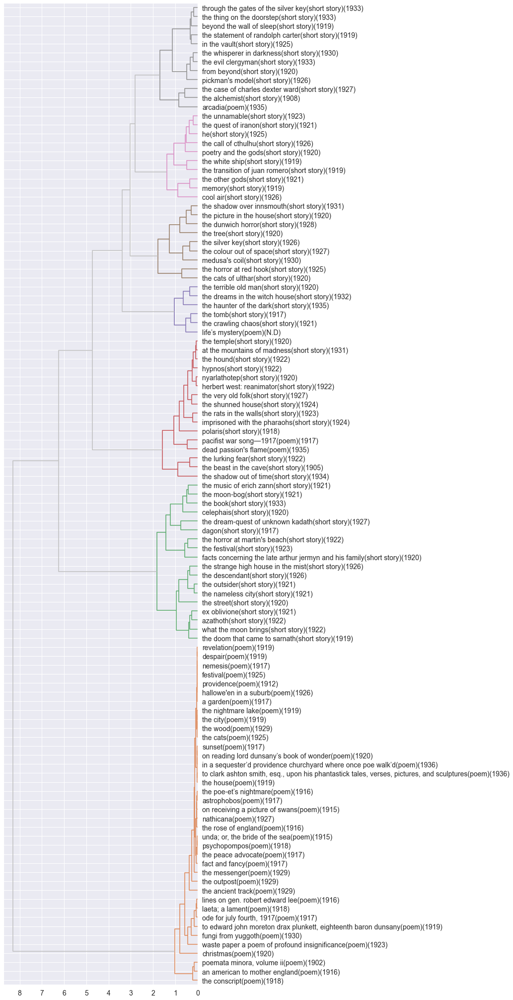

In [92]:
BCM = DCM.groupby('title').mean().sort_index()
BCM.index = LIB.loc[list(BCM.index)].title_dupe_cat_date

dend1 = HAC(BCM)
dend1.w = 7
dend1.color_thresh = 2.5
dend1.plot()

So this is good at separating poetry from short stories.